# Government720 Noisy Extrapolation
This is extrapolating the data using noisy data.

### CLIENT 1

In [2]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT1_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

Mounted at /content/drive
   UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        0.428571  0.000000             NaN  0.000000   
1                NaN        0.439460 -0.006451             NaN -0.015130   
2                NaN        0.461814  0.020851             NaN  0.002986   
3                NaN        0.466160  0.023599             NaN -0.012395   
4                NaN        0.473214 -0.014477             NaN -0.006515   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      0.000000    1.000000    0.000000      NaN       0.000000  ...   
1      0.012035    1.012380    0.015080      NaN      -0.012662  ...   
2     -0.003704    1.000877    0.012387      NaN      -0.001014  ...   
3     -0.024910    0.995282    0.023790      NaN      -0.011743  ...   
4      0.009105    1.000385    0.021138      NaN      -0.002070  ...   

   PAYROLL_TAX  CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0     0.

In [3]:
# Import packages
import numpy as np
from scipy.optimize import curve_fit

# Define function to extrapolate using sinusoidal fitting of known values with 0.01 noise
def extrapolate_column(x_index, y_values, noise_level=0.01):
    # Remove NaN values for fitting
    mask = ~np.isnan(y_values)
    x_known = x_index[mask]
    y_known = y_values[mask]

    # Define a general sinusoidal function: A * sin(B * x + C) + D
    def sin_func(x, A, B, C, D):
        return A * np.sin(B * x + C) + D

    # Improved initial parameter guess: (A, B, C, D)
    A_guess = (np.max(y_known) - np.min(y_known)) / 2  # Amplitude
    B_guess = 2 * np.pi / (x_known[-1] - x_known[0])   # Frequency (1 cycle over known range)
    C_guess = 0                                         # Phase shift
    D_guess = np.mean(y_known)                          # Vertical shift

    # Handle cases where data might not have a clear sinusoidal pattern
    if np.std(y_known) < 1e-5:  # If the data is nearly constant
        B_guess = 0  # Frequency becomes 0 if the data is constant

    # Increase maxfev to give more iterations for convergence
    popt, _ = curve_fit(sin_func, x_known, y_known, p0=[A_guess, B_guess, C_guess, D_guess], maxfev=30000)

    # Predict missing head and tail using the fitted function
    x_head = x_index[: np.where(mask)[0][0]]  # Indices before first known value
    x_tail = x_index[np.where(mask)[0][-1] + 1 :]  # Indices after last known value

    y_head = sin_func(x_head, *popt) if len(x_head) > 0 else np.array([])
    y_tail = sin_func(x_tail, *popt) if len(x_tail) > 0 else np.array([])

    # Add Gaussian noise
    y_head += noise_level * np.random.randn(len(y_head))
    y_tail += noise_level * np.random.randn(len(y_tail))

    # Merge results
    y_full = y_values.copy()
    y_full[np.where(np.isnan(y_values))] = np.concatenate([y_head, y_tail])

    return y_full

In [4]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0              0.090771        0.428571  0.000000        0.564941  0.000000   
1              0.088336        0.439460 -0.006451        0.582133 -0.015130   
2              0.068309        0.461814  0.020851        0.557502  0.002986   
3              0.094006        0.466160  0.023599        0.569352 -0.012395   
4              0.080713        0.473214 -0.014477        0.578737 -0.006515   
...                 ...             ...       ...             ...       ...   
1295           0.061404        0.446429  0.992084        0.553803  0.721304   
1296           0.068841        0.484023  1.003965        0.561947  0.723718   
1297           0.056386        0.491619  0.979914        0.555939  0.706159   
1298           0.047830        0.509606  0.975679        0.554174  0.699791   
1299           0.052632        0.478285  0.994525        0.546731  0.717773   

      POVERTY_WAGE  GENDER_GAP  RACIAL_GAP   DEFICI

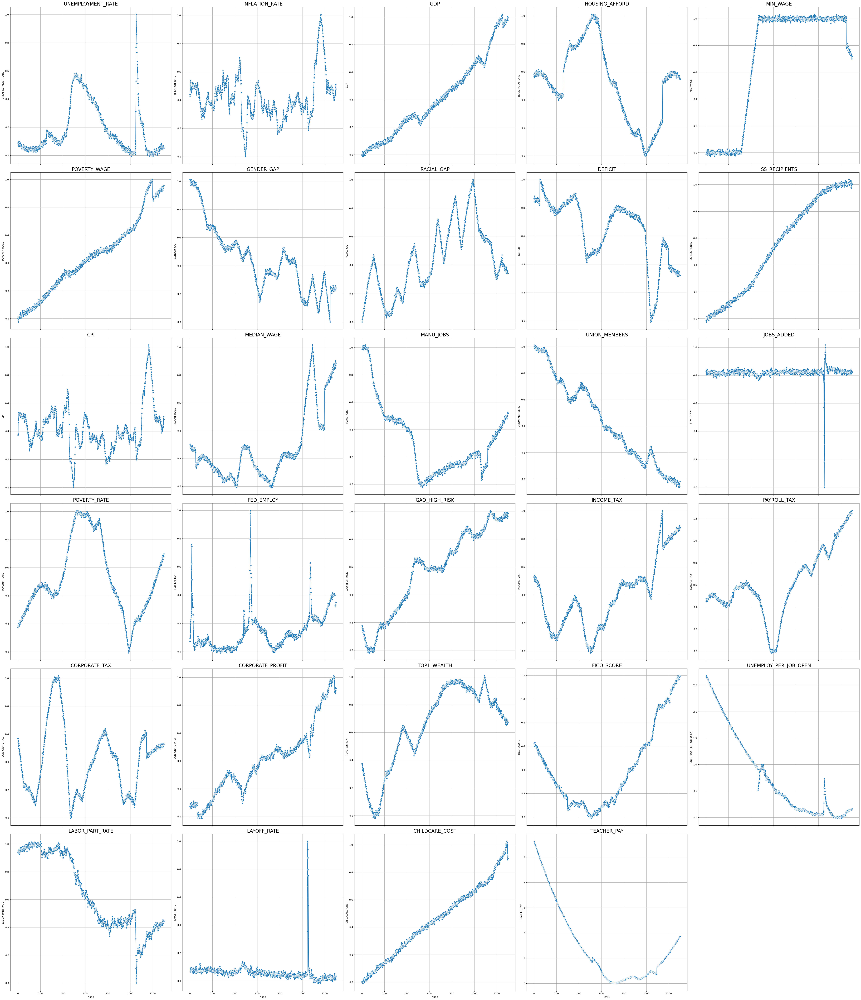

In [5]:
# Make multi-graph chart of scaled time series variables to verify interpolation method is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

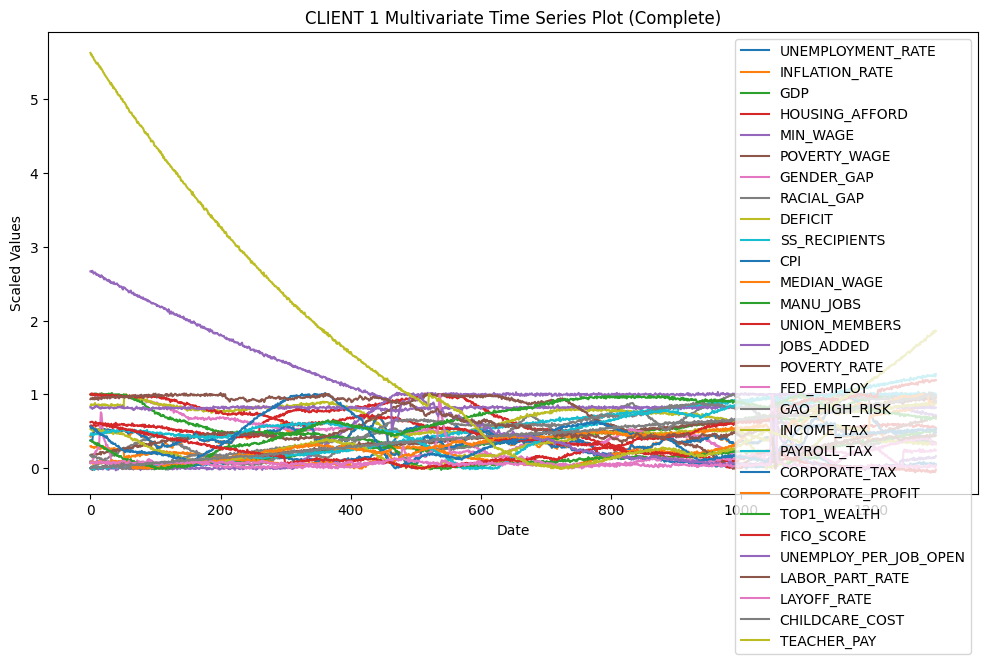

In [6]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 1 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [7]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_Noisy_Extrapolated.xlsx


### CLIENT 2

In [8]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT2_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0     1.000000           NaN            NaN          NaN            NaN   
1     1.000805           NaN            NaN          NaN            NaN   
2     0.980042           NaN            NaN          NaN            NaN   
3     0.981156           NaN            NaN          NaN            NaN   
4     0.994488           NaN            NaN          NaN            NaN   

   MISINFORMATION_MENTIONS  
0                      NaN  
1                      NaN  
2                      NaN  
3                      NaN  
4                      NaN  


In [9]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0        1.000000     -4.309157      -2.678125    -5.812023       0.002739   
1        1.000805     -4.305293      -2.665206    -5.798387      -0.001500   
2        0.980042     -4.287878      -2.672947    -5.783692      -0.014953   
3        0.981156     -4.274124      -2.650962    -5.777694       0.010507   
4        0.994488     -4.264574      -2.674281    -5.751633      -0.006282   
...           ...           ...            ...          ...            ...   
1295     0.000853      0.568702       0.969629     0.429243       0.803126   
1296    -0.004781      0.565058       0.947383     0.417321       0.804328   
1297     0.023673      0.553592       0.954869     0.411711       0.821219   
1298    -0.002152      0.557400       0.952674     0.412240       0.789999   
1299     0.000000      0.569247       0.966717     0.420363       0.788685   

      MISINFORMATION_MENTIONS  
0                   -0.020306  

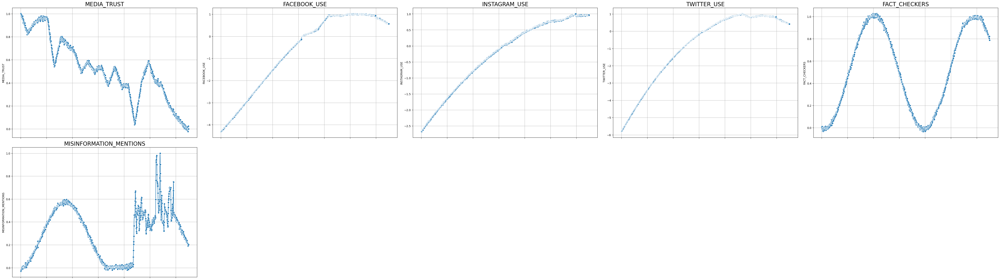

In [11]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

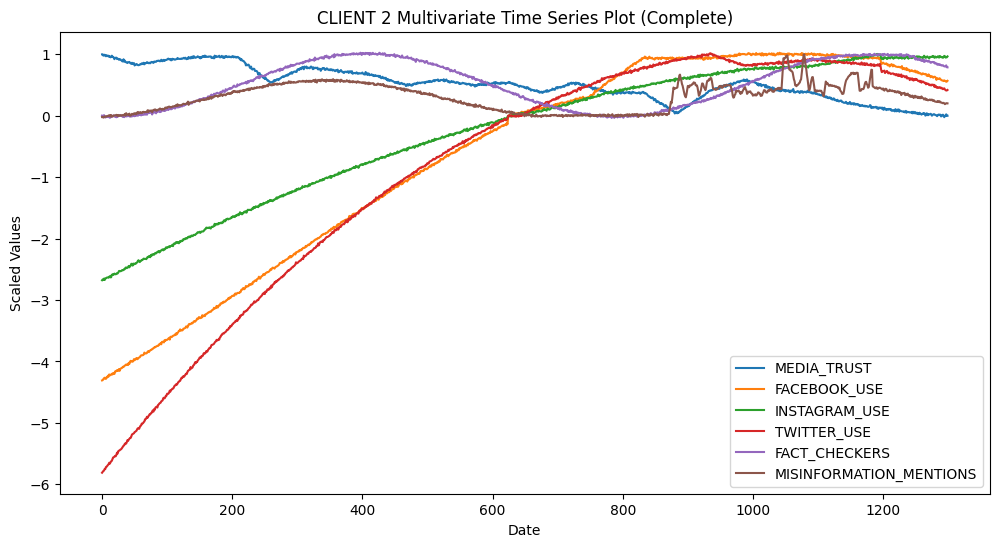

In [12]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 2 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [13]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_Noisy_Extrapolated.xlsx


### CLIENT 3

In [14]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT3_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0        0.065217             0.000000          0.380952  0.000000   
1        0.090339             0.009411          0.391167 -0.014257   
2        0.058582            -0.003475          0.392390  0.001535   
3        0.078690             0.002548          0.383615  0.012880   
4        0.078848             0.003193          0.389130  0.011458   

   OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0           NaN        NaN                  NaN       0.000000   
1           NaN        NaN                  NaN       0.003420   
2           NaN        NaN                  NaN      -0.000364   
3           NaN        NaN                  NaN       0.004246   
4           NaN        NaN                  NaN      -0.005916   

   OPIOID_PRESCRIP  FENTANYL_DEATHS  ALCOHOL_TREATMENT  OPIOID_TREATMENT  \
0              NaN         0.000000                NaN               NaN   
1              NaN         0.0

In [15]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0           0.065217             0.000000          0.380952  0.000000   
1           0.090339             0.009411          0.391167 -0.014257   
2           0.058582            -0.003475          0.392390  0.001535   
3           0.078690             0.002548          0.383615  0.012880   
4           0.078848             0.003193          0.389130  0.011458   
...              ...                  ...               ...       ...   
1244        0.829501             1.024480          0.822564  0.872518   
1245        0.840526             1.009551          0.818597  0.889571   
1246        0.836288             1.016031          0.828448  0.887783   
1247        0.816141             1.006470          0.817606  0.886177   
1248        0.826087             1.032847          0.824897  0.883845   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0         0.010521   7.485847             1.353553    

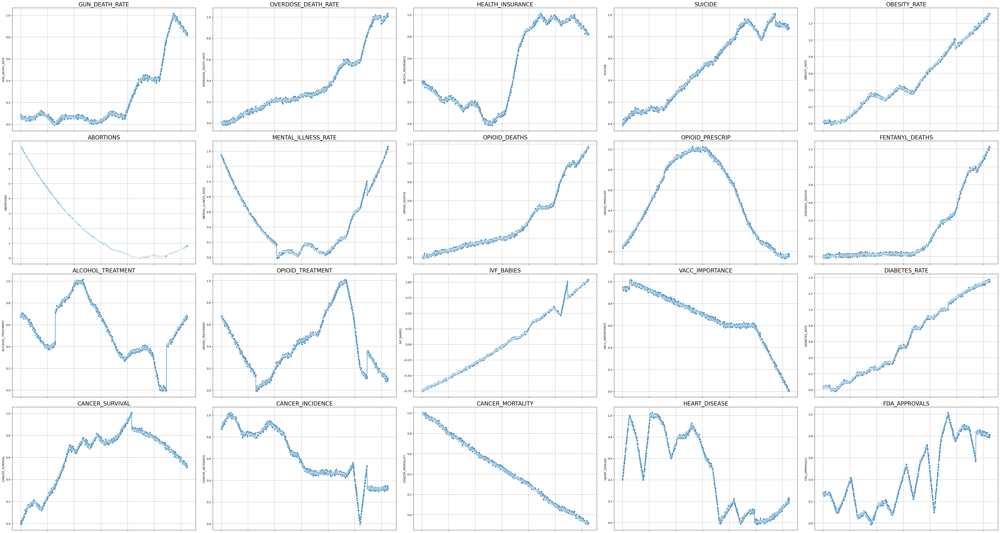

In [16]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

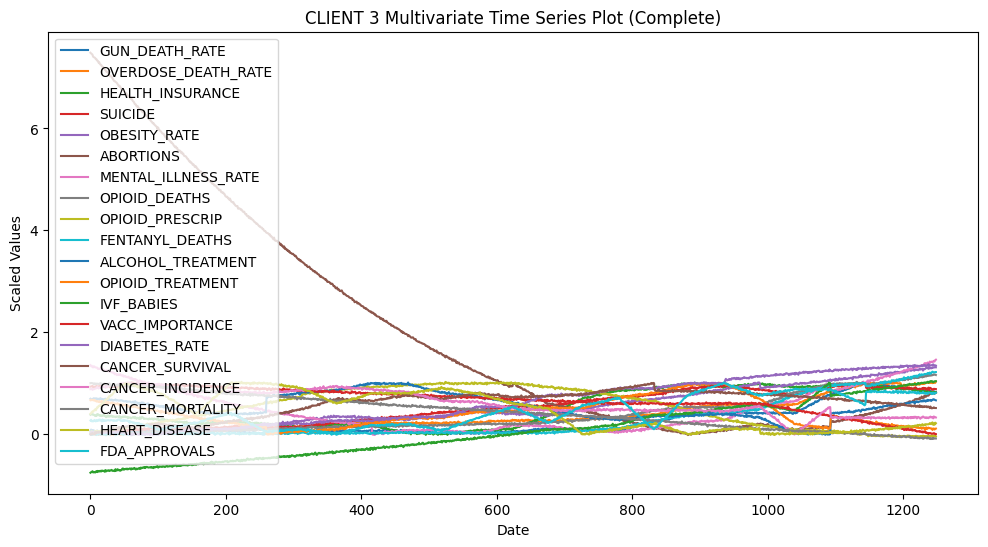

In [17]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 3 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [18]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_Noisy_Extrapolated.xlsx


### CLIENT 4

In [19]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT4_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0    0.023149       0.705882                     NaN              NaN   
1    0.034879       0.701109                     NaN              NaN   
2    0.024606       0.677900                     NaN              NaN   
3    0.031582       0.684180                     NaN              NaN   
4    0.032320       0.649366                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

In [20]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0       0.023149       0.705882                0.880868         0.025009   
1       0.034879       0.701109                0.888837         0.009958   
2       0.024606       0.677900                0.898276         0.006978   
3       0.031582       0.684180                0.887788        -0.002898   
4       0.032320       0.649366                0.889253         0.001380   
...          ...            ...                     ...              ...   
1295    0.042392       0.304440                0.225404         0.753365   
1296    0.056575       0.294347                0.222405         0.755617   
1297    0.033419       0.303321                0.231724         0.750935   
1298    0.036271       0.300771                0.222952         0.727209   
1299    0.021290       0.288433                0.226864         0.744526   

      ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0          0.428836       

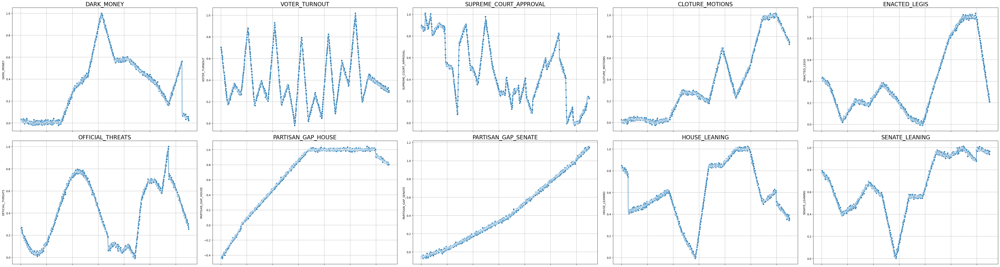

In [21]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

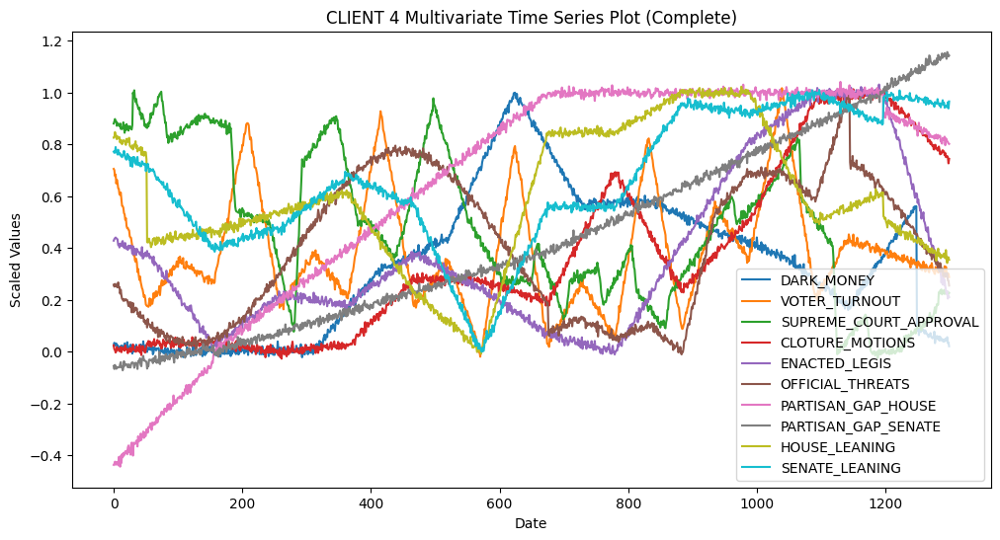

In [22]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 4 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [23]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_Noisy_Extrapolated.xlsx


### CLIENT 5

In [24]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT5_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0        0.000000         0.000000        0.000000        NaN      0.300000   
1       -0.006552         0.003497        0.003064        NaN      0.299539   
2        0.022798        -0.010235        0.026125        NaN      0.302126   
3        0.003382         0.005894        0.013857        NaN      0.304973   
4        0.008888        -0.001661        0.033394        NaN      0.312796   

   MATH_PROF  
0   0.000000  
1  -0.013301  
2   0.010318  
3   0.020458  
4   0.003800  


In [25]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0           0.000000         0.000000        0.000000  -0.159920   
1          -0.006552         0.003497        0.003064  -0.162159   
2           0.022798        -0.010235        0.026125  -0.168716   
3           0.003382         0.005894        0.013857  -0.166034   
4           0.008888        -0.001661        0.033394  -0.172260   
...              ...              ...             ...        ...   
1295        0.941522         1.094491        0.363984   1.006990   
1296        0.945133         1.126258        0.351478   1.018019   
1297        0.955071         1.124795        0.375492   0.998280   
1298        0.932058         1.101322        0.342678   1.016240   
1299        0.920160         1.129087        0.347753   1.000000   

      READING_PROF  MATH_PROF  
0         0.300000   0.000000  
1         0.299539  -0.013301  
2         0.302126   0.010318  
3         0.304973   0.020458  
4         0.312796   0.

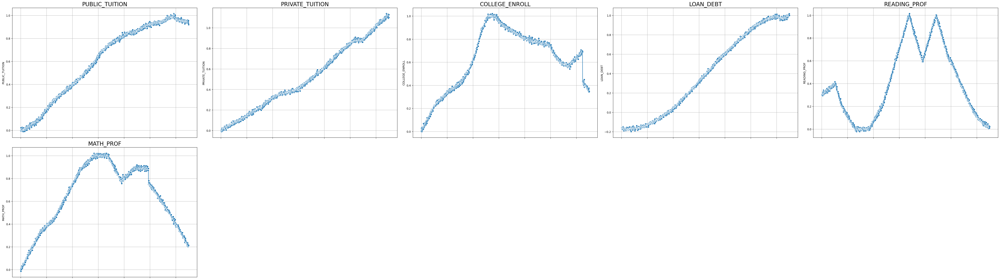

In [26]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

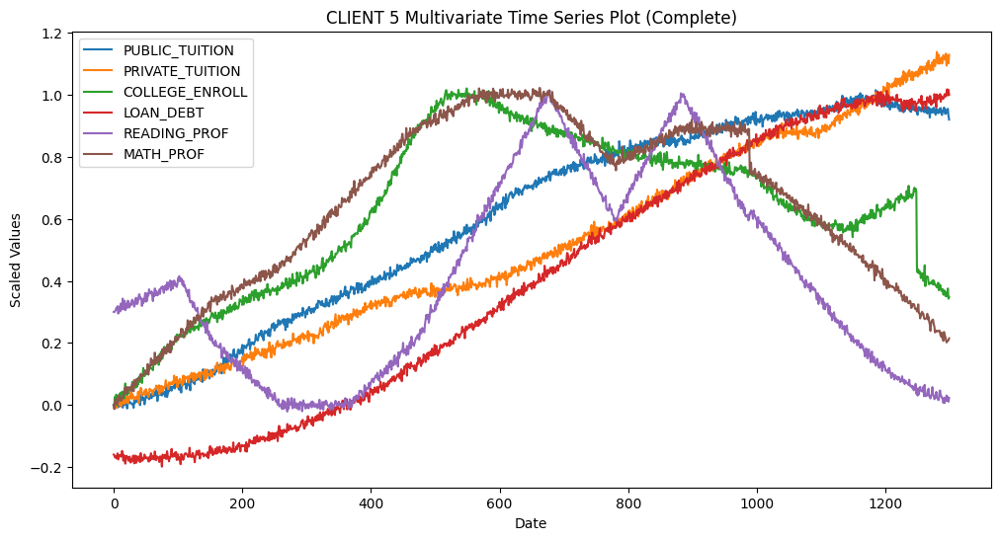

In [27]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 5 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [28]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_Noisy_Extrapolated.xlsx


### CLIENT 6

In [29]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT6_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0  0.113300     0.037699    0.140244        0.684411        0.058927   
1  0.109691     0.042296    0.115733        0.686080        0.061647   
2  0.116058     0.051494    0.137692        0.701297        0.041437   
3  0.100838     0.040681    0.128553        0.706069        0.033212   
4  0.116816     0.040807    0.123539        0.686636        0.069543   

   RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0       0.145877   0.905405         0.000000           0.000000   
1       0.154892   0.910869        -0.012856           0.003199   
2       0.129369   0.900156         0.014606           0.018232   
3       0.142719   0.893357        -0.010428           0.005029   
4       0.167286   0.892179        -0.005302           0.004798   

   FEMA_SPENDING  NATURAL_DISASTERS  SURFACE_TEMP  
0       0.015992           0.080000      0.531773  
1       0.018189           0.076615      0.517545  
2       

In [30]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0     0.113300     0.037699    0.140244        0.684411        0.058927   
1     0.109691     0.042296    0.115733        0.686080        0.061647   
2     0.116058     0.051494    0.137692        0.701297        0.041437   
3     0.100838     0.040681    0.128553        0.706069        0.033212   
4     0.116816     0.040807    0.123539        0.686636        0.069543   
...        ...          ...         ...             ...             ...   
1244  0.992861     0.999025    1.015714        0.396472        0.996867   
1245  1.001568     1.016848    1.001193        0.384250        0.986242   
1246  1.011728     0.988659    1.008425        0.383288        0.988218   
1247  0.994765     1.010774    1.009411        0.401702        0.998675   
1248  1.000000     1.000000    1.000000        0.392902        1.000000   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0          0.145877   0.90540

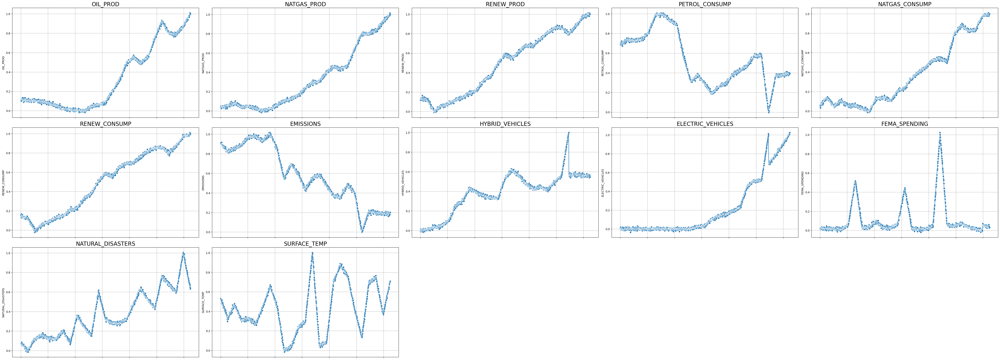

In [32]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

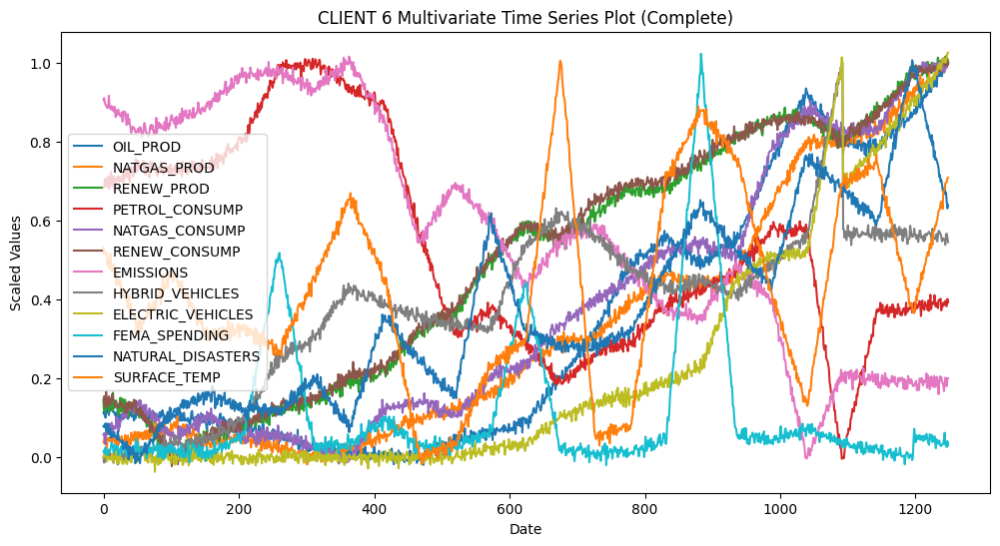

In [33]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 6 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [34]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_Noisy_Extrapolated.xlsx


### CLIENT 7

In [35]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT7_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                NaN       0.000000          0.000000         0.005805   
1                NaN       0.020830         -0.010088         0.017746   
2                NaN      -0.010507          0.023193         0.024890   
3                NaN       0.013128          0.006863         0.015608   
4                NaN      -0.011326          0.021793         0.003084   

   DEPORTATIONS  ASYLUM_APPS  
0           NaN          NaN  
1           NaN          NaN  
2           NaN          NaN  
3           NaN          NaN  
4           NaN          NaN  


In [36]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0              0.350188       0.000000          0.000000         0.005805   
1              0.373519       0.020830         -0.010088         0.017746   
2              0.373558      -0.010507          0.023193         0.024890   
3              0.328368       0.013128          0.006863         0.015608   
4              0.352767      -0.011326          0.021793         0.003084   
...                 ...            ...               ...              ...   
1287           0.442213       1.029269          0.103332         0.790930   
1288           0.452350       1.028369          0.097586         0.818526   
1289           0.427172       1.034979          0.075764         0.823983   
1290           0.410081       1.026426          0.073787         0.814454   
1291           0.430597       1.007199          0.078799         0.806316   

      DEPORTATIONS  ASYLUM_APPS  
0         0.150875    -3.991416  
1      

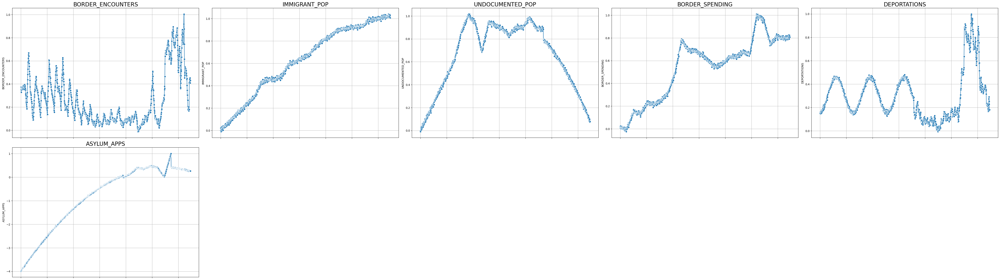

In [37]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

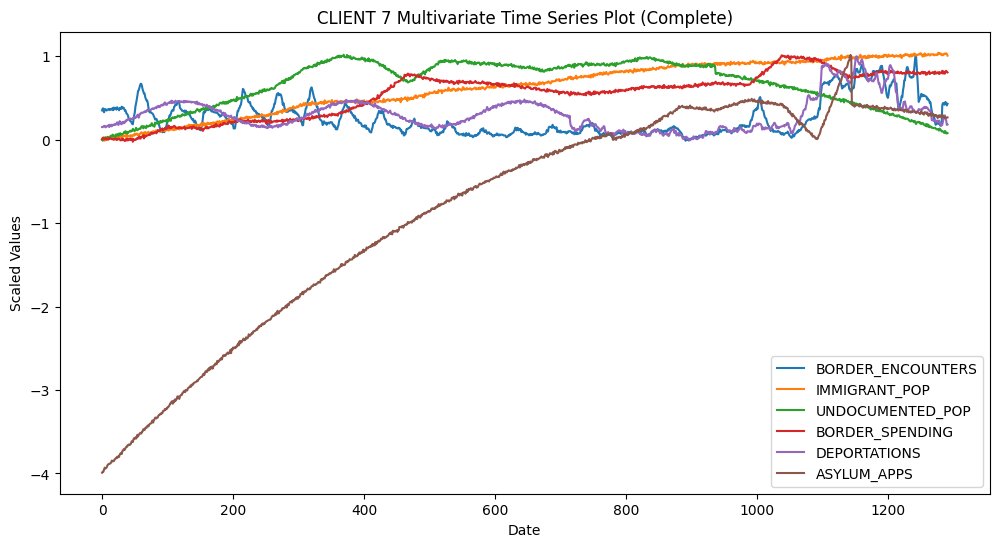

In [38]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 7 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [39]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_Noisy_Extrapolated.xlsx


### CLIENT 8

In [40]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT8_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0             NaN           NaN        0.770270        0.000000   1.000000   
1             NaN           NaN        0.773236       -0.002098   0.987528   
2             NaN           NaN        0.767205       -0.009087   0.994172   
3             NaN           NaN        0.771403        0.002883   0.996362   
4             NaN           NaN        0.771093        0.016500   1.000172   

   HISPANIC_POP  BLACK_POP  AAPI_POP  CHRISTIAN_POP  NON_RELIGIOUS_POP  
0      0.000000   0.000000  0.000000       1.000000           0.000000  
1      0.024305   0.004994  0.004405       0.997087          -0.011273  
2     -0.009275   0.010404  0.006522       0.995965          -0.008178  
3      0.015473  -0.001379  0.015634       0.994899          -0.008221  
4     -0.003471  -0.006495 -0.003704       0.999030          -0.000928  


In [41]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0           1.469378      0.037722        0.770270        0.000000   1.000000   
1           1.446335      0.024164        0.773236       -0.002098   0.987528   
2           1.464821      0.013725        0.767205       -0.009087   0.994172   
3           1.449355      0.033231        0.771403        0.002883   0.996362   
4           1.474001      0.034971        0.771093        0.016500   1.000172   
...              ...           ...             ...             ...        ...   
1192        0.983875      0.972851       -0.000826        1.022095   0.020806   
1193        1.000668      0.978093        0.003577        1.016186   0.018518   
1194        1.003219      0.974270        0.002834        1.011378   0.007696   
1195        1.010529      0.986438       -0.016906        1.009098   0.001077   
1196        1.000000      1.000000        0.000000        1.014330   0.000000   

      HISPANIC_POP  BLACK_P

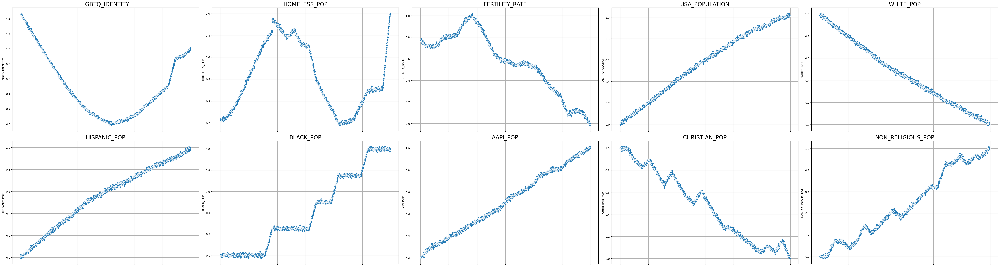

In [42]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

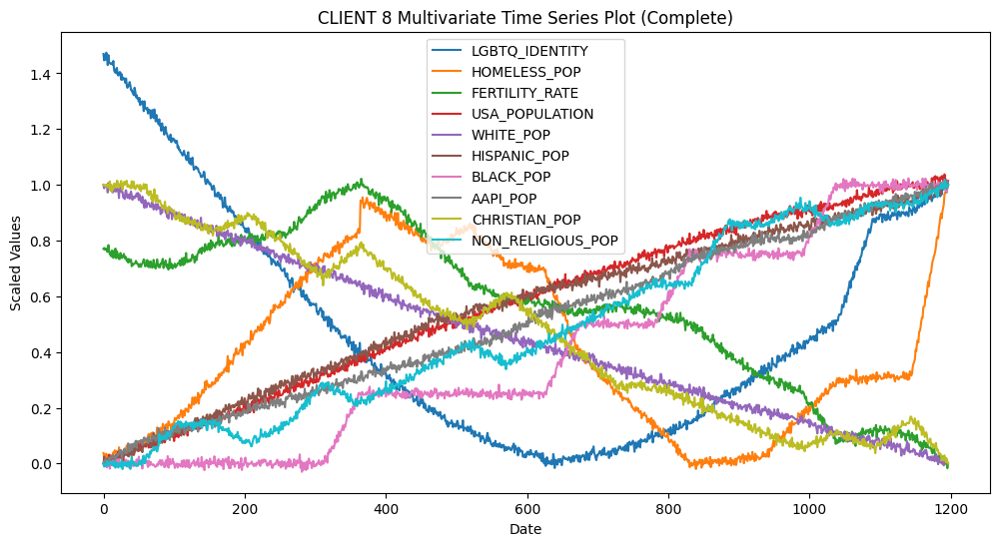

In [43]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 8 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [44]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_Noisy_Extrapolated.xlsx


### CLIENT 9

In [45]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT9_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0     0.060345        0.911036                     NaN    0.093671
1     0.060881        0.925541                     NaN    0.091258
2     0.050339        0.907444                     NaN    0.113566
3     0.049687        0.908705                     NaN    0.112894
4     0.059429        0.908205                     NaN    0.115465


In [46]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0        0.060345        0.911036                0.838138    0.093671
1        0.060881        0.925541                0.837989    0.091258
2        0.050339        0.907444                0.845220    0.113566
3        0.049687        0.908705                0.833079    0.112894
4        0.059429        0.908205                0.834027    0.115465
...           ...             ...                     ...         ...
1192     0.854621        0.214387                0.013554    0.686135
1193     0.847406        0.228937                0.017110    0.676936
1194     0.847392        0.200660                0.008442    0.682798
1195     0.845808        0.204717                0.001106    0.674133
1196     0.864265        0.197231                0.000000    0.695662

[1197 rows x 4 columns]


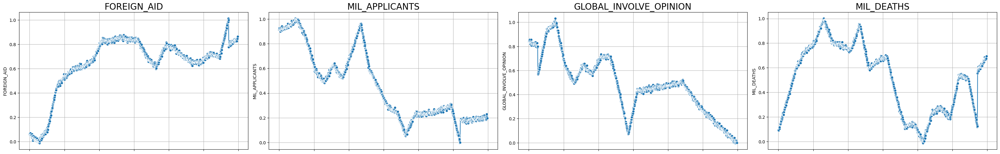

In [47]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

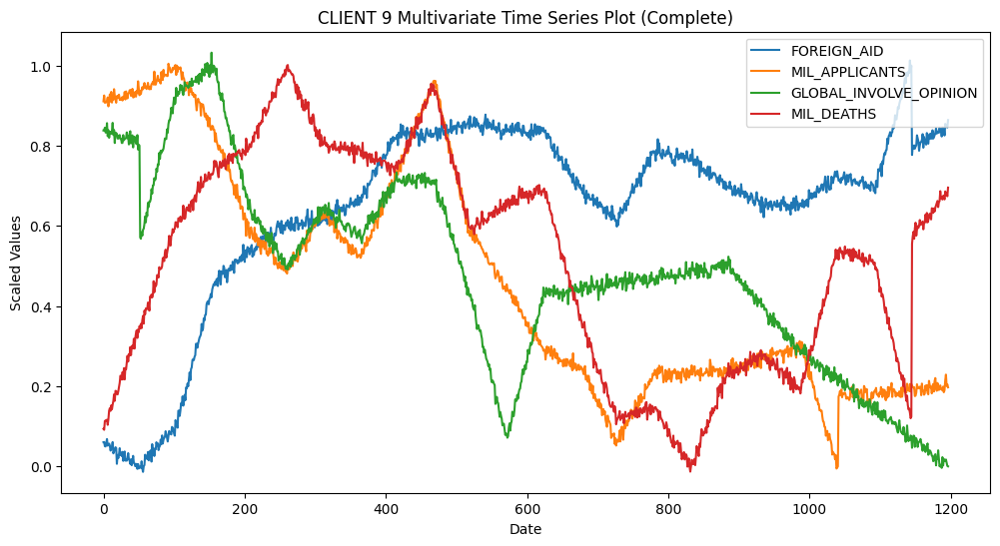

In [48]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 9 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [49]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_Noisy_Extrapolated.xlsx


### CLIENT 10

In [50]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT10_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   GOOD_BRIDGES  UNSATIS_ROADS
0           NaN       0.254054
1           NaN       0.278506
2           NaN       0.248426
3           NaN       0.264545
4           NaN       0.236567


In [51]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      GOOD_BRIDGES  UNSATIS_ROADS
0         0.788511       0.254054
1         0.791731       0.278506
2         0.773093       0.248426
3         0.761922       0.264545
4         0.779546       0.236567
...            ...            ...
1192      0.000419       0.310450
1193     -0.017721       0.298030
1194      0.013624       0.287847
1195      0.016764       0.302201
1196      0.000000       0.291970

[1197 rows x 2 columns]


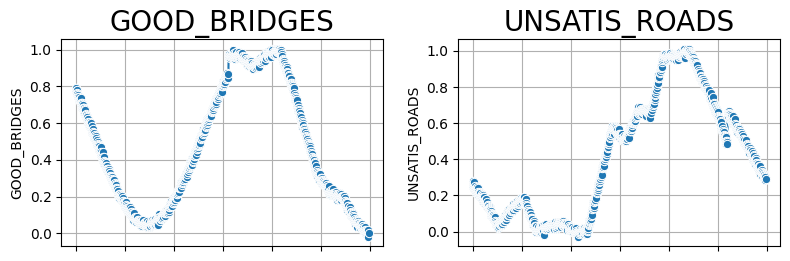

In [52]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

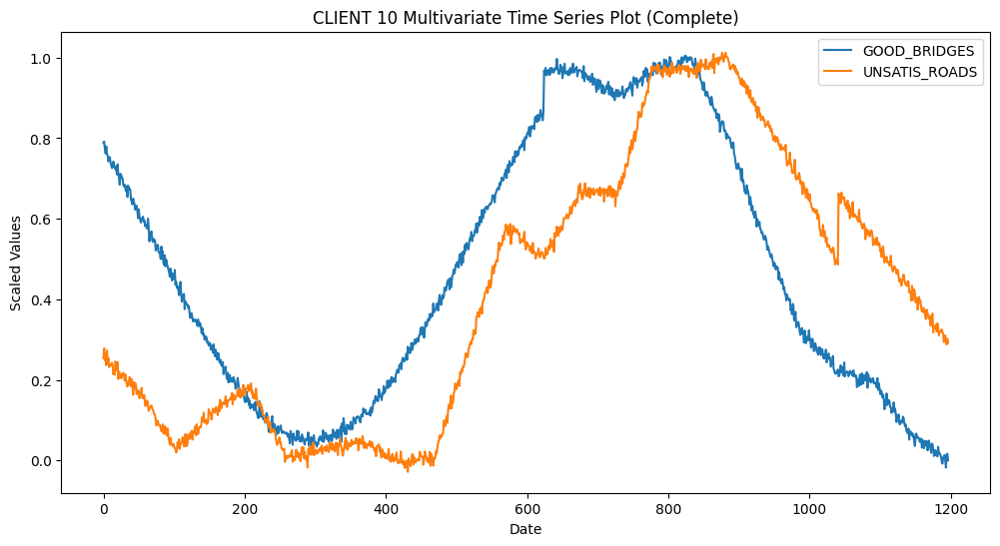

In [53]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 10 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [54]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_Noisy_Extrapolated.xlsx


### CLIENT 11

In [55]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT11_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0         0.000000           0.002840      0.100515                NaN   
1         0.021046          -0.023751      0.096047                NaN   
2        -0.003229          -0.002831      0.087167                NaN   
3         0.009859          -0.004116      0.083484                NaN   
4         0.006402          -0.011296      0.077313                NaN   

   INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0          0.784431       0.258065                   NaN   
1          0.777165       0.255485                   NaN   
2          0.787545       0.253542                   NaN   
3          0.788040       0.272786                   NaN   
4          0.790418       0.309505                   NaN   

   DOM_TERROR_DEFENDANTS  FBI_INVESTIGATIONS  FBI_DISRUPTIONS  \
0                    NaN                 NaN              NaN   
1                    NaN                 NaN              NaN   

In [56]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0            0.000000           0.002840      0.100515           0.208219   
1            0.021046          -0.023751      0.096047           0.209461   
2           -0.003229          -0.002831      0.087167           0.225256   
3            0.009859          -0.004116      0.083484           0.228437   
4            0.006402          -0.011296      0.077313           0.220965   
...               ...                ...           ...                ...   
1192         1.081105           1.109479      0.210406           0.093910   
1193         1.089846           1.125504      0.179506           0.056561   
1194         1.075938           1.113576      0.195317           0.065203   
1195         1.072258           1.119516      0.186817           0.076462   
1196         1.072732           1.124609      0.173283           0.083461   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

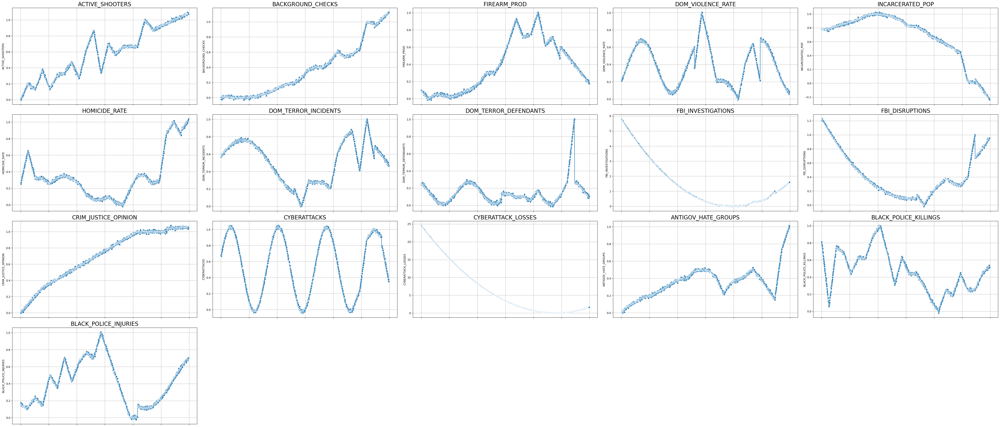

In [57]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

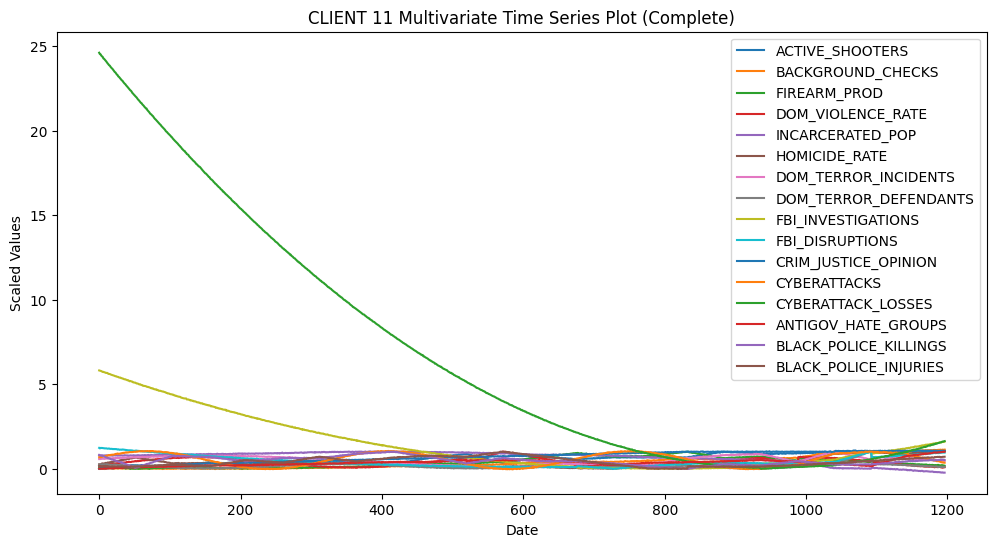

In [58]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 11 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [59]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_Noisy_Extrapolated.xlsx


### CLIENT 12

In [60]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT12_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   AGRI_SPENDING     FARMS  AGRI_SALES
0       1.000000  0.747482    0.033151
1       0.988731  0.740141    0.039764
2       0.987283  0.738698    0.043071
3       0.996873  0.739819    0.022771
4       0.988274  0.751758    0.041346


In [61]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      AGRI_SPENDING     FARMS  AGRI_SALES
0          1.000000  0.747482    0.033151
1          0.988731  0.740141    0.039764
2          0.987283  0.738698    0.043071
3          0.996873  0.739819    0.022771
4          0.988274  0.751758    0.041346
...             ...       ...         ...
1140       0.314640  0.177960    0.982922
1141       0.287058  0.169106    0.958390
1142       0.316792  0.166598    1.000478
1143       0.286091  0.177049    1.006259
1144       0.307089  0.152823    1.000000

[1145 rows x 3 columns]


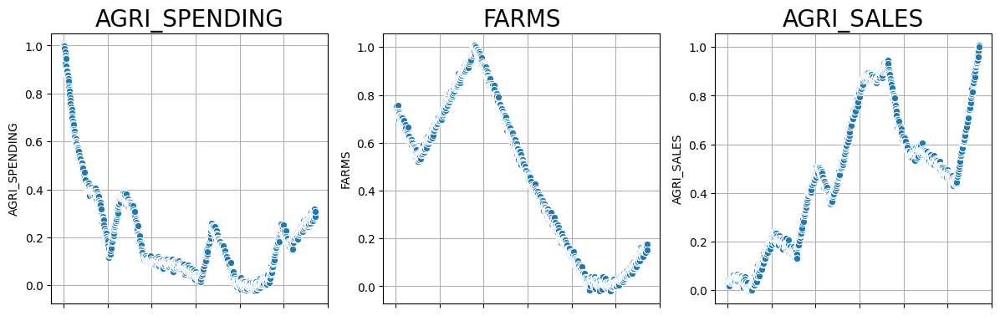

In [62]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

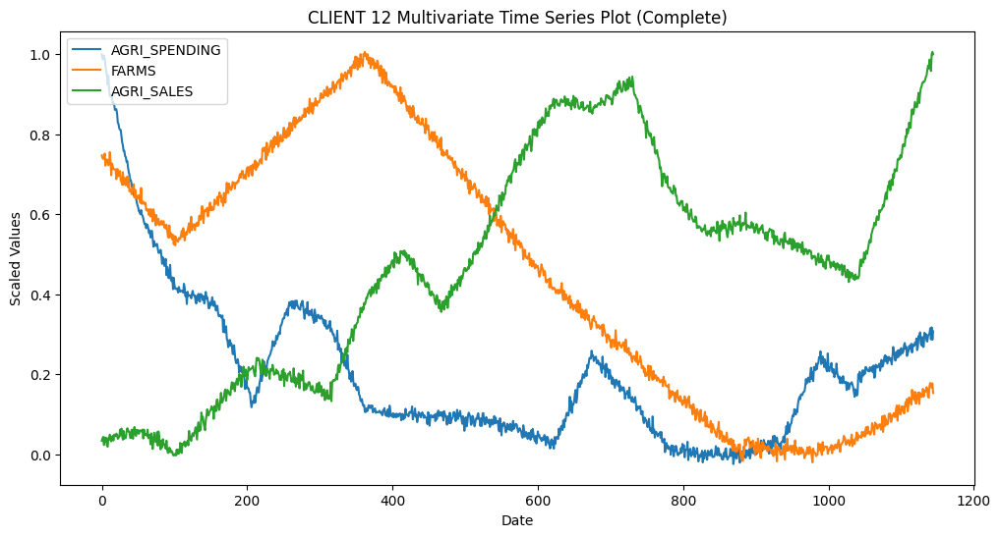

In [63]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 12 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [64]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_Noisy_Extrapolated.xlsx


In [65]:
# End of code 3/6/25